# Introduction

**Data Set Information:**

The data is related with direct marketing campaigns of a European banking institution. The marketing campaigns were based on phone calls and were for marketing their product - bank term deposit. The information of client subscribing to the product is indicated in the column y which is either yes or no. Information about a predictive model currently being used by the bank is also included. The dataset contains 41188 records with 20 inputs, ordered by date (from May 2008 to November 2010).

**Problem Statement:**

The task is to study the data, find data patterns and clean the data for further modeling to help this banking institution determine, in advance, clients who will be receptive to such marketing campaigns. Evaluate performance of the deployed model, state the evaluation metric used and suggest whether the bank ought to replace the current model.

**Attribute Information:**

Input variables: <br>
1 - age (numeric) <br>
2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown') <br>
3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed) <br> 4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown') <br>
5 - default: has credit in default? (categorical: 'no','yes','unknown') <br>
6 - housing: has housing loan? (categorical: 'no','yes','unknown') <br>
7 - loan: has personal loan? (categorical: 'no','yes','unknown') # related with the last contact of the current campaign: <br>
8 - contact: contact communication type (categorical: 'cellular','telephone') <br>
9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec') <br>
10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri') <br>
11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included
for benchmark purposes and should be discarded if the intention is to have a realistic predictive model. # other attributes: <br>
12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact) <br>
13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted) <br>
14 - previous: number of contacts performed before this campaign and for this client (numeric) <br>
15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success') # social and economic context attributes <br>
16 - emp.var.rate: employment variation rate - quarterly indicator (numeric) <br>
17 - cons.price.idx: consumer price index - monthly indicator (numeric) <br>
18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric) <br>
19 - euribor3m: euribor 3 month rate - daily indicator (numeric) <br>
20 - nr.employed: number of employees - quarterly indicator (numeric) <br>
21- ModelPerformance – Results from a current model used to predict whether a client will subscribe (‘yes’) to a term deposit (probability of subscribing to term deposit)  <br>
22 - Output Variable (desired target): y - has the client subscribed a term deposit? (binary: 'yes','no')

In [1]:
#Importing Data Analysis Libraries

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from plotly import tools
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

import warnings
warnings.filterwarnings('ignore')
import os


In [2]:
#import datasheet

df = pd.read_csv('DSA Data Set.csv')

In [3]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,ModelPrediction,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0.932750,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0.953579,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0.945724,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0.933875,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0.940996,no


# Data Cleaning

In [4]:
#Change column name: 'y' to 'response'
df.rename(index=str, columns={'y': 'response'}, inplace = True)

In [5]:
#Checking for null or missing values
df.info()
#All the columns are non-null, no missing values 

<class 'pandas.core.frame.DataFrame'>
Index: 41188 entries, 0 to 41187
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   age              41188 non-null  int64  
 1   job              41188 non-null  object 
 2   marital          41188 non-null  object 
 3   education        41188 non-null  object 
 4   default          41188 non-null  object 
 5   housing          41188 non-null  object 
 6   loan             41188 non-null  object 
 7   contact          41188 non-null  object 
 8   month            41188 non-null  object 
 9   day_of_week      41188 non-null  object 
 10  duration         41188 non-null  int64  
 11  campaign         41188 non-null  int64  
 12  pdays            41188 non-null  int64  
 13  previous         41188 non-null  int64  
 14  poutcome         41188 non-null  object 
 15  emp.var.rate     41188 non-null  float64
 16  cons.price.idx   41188 non-null  float64
 17  cons.conf.idx    

All the columns are non-null, no missing values 

In [6]:
#checking for duplicated rows
duplicate = df[df.duplicated()]
duplicate

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,ModelPrediction,response
1266,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,...,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,0.945200,no
12261,36,retired,married,unknown,no,no,no,telephone,jul,thu,...,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,0.956465,no
14234,27,technician,single,professional.course,no,no,no,cellular,jul,mon,...,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,0.956728,no
16956,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,...,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,0.961048,no
18465,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,...,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,0.955202,no
20216,55,services,married,high.school,unknown,no,no,cellular,aug,mon,...,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,0.970002,no
20534,41,technician,married,professional.course,no,yes,no,cellular,aug,tue,...,999,0,nonexistent,1.4,93.444,-36.1,4.966,5228.1,0.956788,no
25217,39,admin.,married,university.degree,no,no,no,cellular,nov,tue,...,999,0,nonexistent,-0.1,93.200,-42.0,4.153,5195.8,0.932301,no
28477,24,services,single,high.school,no,yes,no,cellular,apr,tue,...,999,0,nonexistent,-1.8,93.075,-47.1,1.423,5099.1,0.842341,no
32516,35,admin.,married,university.degree,no,yes,no,cellular,may,fri,...,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,0.827244,no


No duplicate rows

# Exploratory Data Analysis

In [7]:
#Statistical analysis of numerical columns of the dataset
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,ModelPrediction
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911,0.887597
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528,0.125351
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000,0.250174
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000,0.857484
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000,0.945879
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000,0.959214
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000,0.988360


In [8]:
#Understanding the unique values per column
print('Job:\n', df['job'].unique())
print('Marital Status:\n', df['marital'].unique())
print('Education:\n', df['education'].unique())
print('Default:\n', df['default'].unique())
print('Housing:\n', df['housing'].unique())
print('Loan:\n', df['loan'].unique())
print('Contact:\n', df['contact'].unique())
print('Month:\n', df['month'].unique())
print('Day of Week:\n', df['day_of_week'].unique())
print('Campaign:\n', df['campaign'].unique())
print('Pdays:\n', df['pdays'].unique())
print('Previous:\n', df['previous'].unique())
print('Subscribed:\n', df['response'].unique())

Job:
 ['housemaid' 'services' 'admin.' 'blue-collar' 'technician' 'retired'
 'management' 'unemployed' 'self-employed' 'unknown' 'entrepreneur'
 'student']
Marital Status:
 ['married' 'single' 'divorced' 'unknown']
Education:
 ['basic.4y' 'high.school' 'basic.6y' 'basic.9y' 'professional.course'
 'unknown' 'university.degree' 'illiterate']
Default:
 ['no' 'unknown' 'yes']
Housing:
 ['no' 'yes' 'unknown']
Loan:
 ['no' 'yes' 'unknown']
Contact:
 ['telephone' 'cellular']
Month:
 ['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'mar' 'apr' 'sep']
Day of Week:
 ['mon' 'tue' 'wed' 'thu' 'fri']
Campaign:
 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 19 18 23 14 22 25 16 17 15 20 56
 39 35 42 28 26 27 32 21 24 29 31 30 41 37 40 33 34 43]
Pdays:
 [999   6   4   3   5   1   0  10   7   8   9  11   2  12  13  14  15  16
  21  17  18  22  25  26  19  27  20]
Previous:
 [0 1 2 3 4 5 6 7]
Subscribed:
 ['no' 'yes']


In [9]:
#Cleaning - Replacing the unknown values in job and education variables as other
df[['job','education']] = df[['job', 'education']].replace(['unknown'],'other')

In [10]:
print('Job:\n', df['job'].unique())
print('Education:\n', df['education'].unique())

Job:
 ['housemaid' 'services' 'admin.' 'blue-collar' 'technician' 'retired'
 'management' 'unemployed' 'self-employed' 'other' 'entrepreneur'
 'student']
Education:
 ['basic.4y' 'high.school' 'basic.6y' 'basic.9y' 'professional.course'
 'other' 'university.degree' 'illiterate']


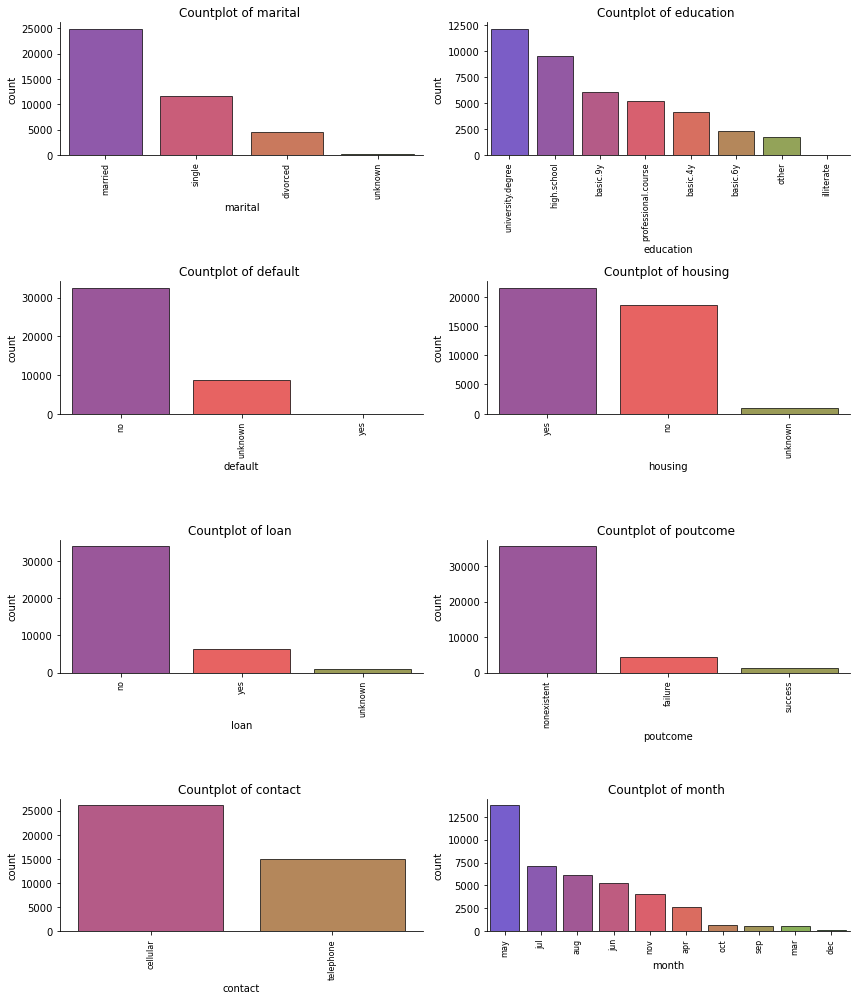

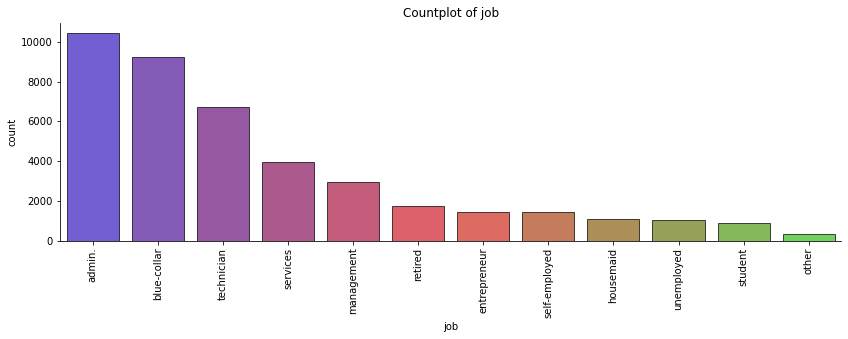

In [11]:
#Distribution of Categorical Variables
plt.figure(figsize=[12,14])
cat_variables=["marital", "education", "default", "housing", "loan", "poutcome","contact", "month"]
n=1
for i in cat_variables:
    order1 = df[i].value_counts(ascending=False).index
    plt.subplot(4,2,n)
    sns.countplot(x=i, edgecolor="black", alpha=0.7, data=df, order = order1, palette= 'brg')
    plt.xticks(fontsize=8,rotation=90)
    sns.despine()
    plt.title("Countplot of {} ".format(i))
    n=n+1
plt.tight_layout()
plt.show()

    
plt.figure(figsize=[14,4])
order1 = df['job'].value_counts(ascending=False).index
sns.countplot(x='job',edgecolor="black", alpha=0.7, data=df, palette= 'brg', order = order1)
plt.xticks(fontsize=10,rotation=90)
sns.despine()
plt.title("Countplot of job")
plt.show()



**For Numerical Columns**

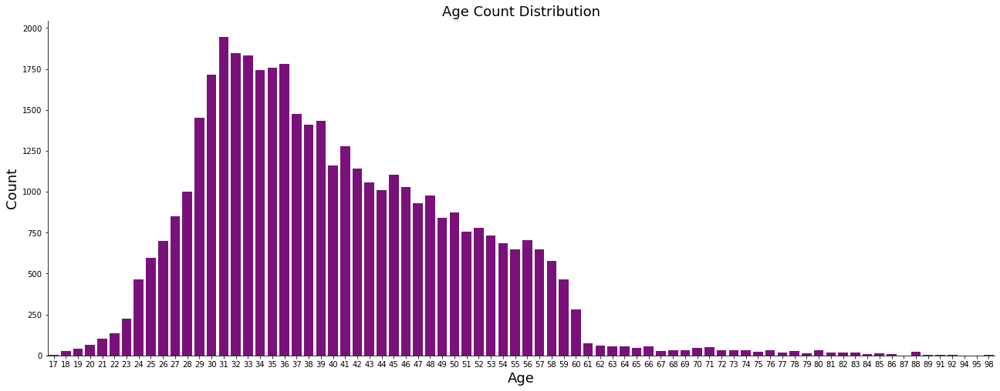

In [12]:
#For understanding age distribution
fig, ax = plt.subplots()
fig.set_size_inches(22, 8)
sns.countplot(x = 'age', data = df, color = "darkmagenta")
ax.set_xlabel('Age', fontsize=18)
ax.set_ylabel('Count', fontsize=18)
ax.set_title('Age Count Distribution', fontsize=18)
sns.despine()

In [13]:
import plotly.express as px
fig = px.box(df, y="age", title = "Age Distribution", 
             color_discrete_sequence= px.colors.diverging.PRGn)
fig.show()

**Analysis of Age Distribution**


The distribution of age: In its telemarketing campaigns, clients called by the bank have an extensive age range, from 17 to 98 years old. However, a majority of customers called is in the age of 30s and 40s (32 to 47 years old fall within the 25th to 75th percentiles). The distribution of customer age is fairly normal with a small standard deviation.

In [14]:
df['age'].describe()

count    41188.00000
mean        40.02406
std         10.42125
min         17.00000
25%         32.00000
50%         38.00000
75%         47.00000
max         98.00000
Name: age, dtype: float64

In [15]:
fig = px.box(df, x="duration", title = "Duration Distribution", color_discrete_sequence= px.colors.diverging.PRGn)
fig.show()

**Analysis for Duration**

As observed from the box plot, the duration of contact has a median of 3 minutes, with an interquartile range of 1.73 minutes to 5.3 minutes. The left-skewed boxplot indicates that most calls are relatively short. Also, there is a large number of outliers ranging from 10 minutes to 40 minutes.

In [16]:
fig = px.box(df, x="campaign", title = "Campaign Distribution", color_discrete_sequence= px.colors.diverging.PRGn)
fig.show()

**Analysis for Campaign Distribution**

About half of the clients have been contacted by the bank for the second time, while 25% was first introduced to the term deposit. Most clients have been reached by the bank for one to three times, which is reasonable. However, some clients have been contacted by as high as 56 times, which is not normal. These clients may have some special needs that require frequent contact.

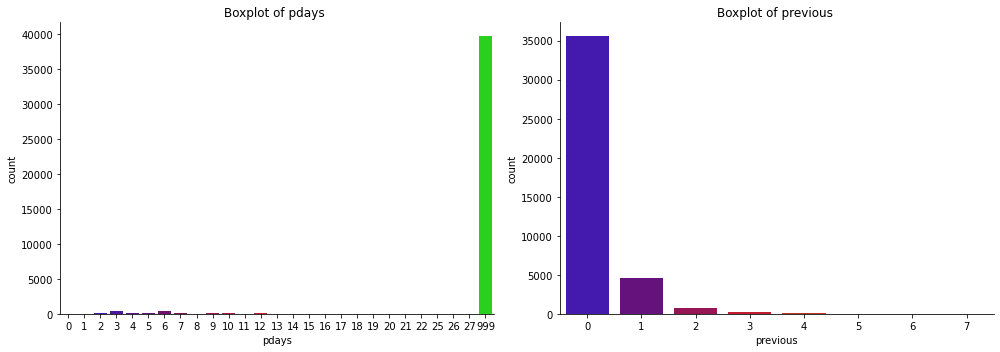

In [17]:
#Distribution of previous marketing attributes
plt.figure(figsize=[14,5])
socio_eco_variables=["pdays", "previous"]
n=1
for i in socio_eco_variables:
    plt.subplot(1,2,n)
    sns.countplot(x=i, data=df, palette = 'brg')
    sns.despine()
    plt.title("Boxplot of {} ".format(i))
    n=n+1
plt.tight_layout()
plt.show()
#tableau refer

**Observation:**

Pdays - Number of days that passed by after the client was last contacted from a previous campaign

Previous - Number of contacts performed before this campaign and for this client  have no effect on response.

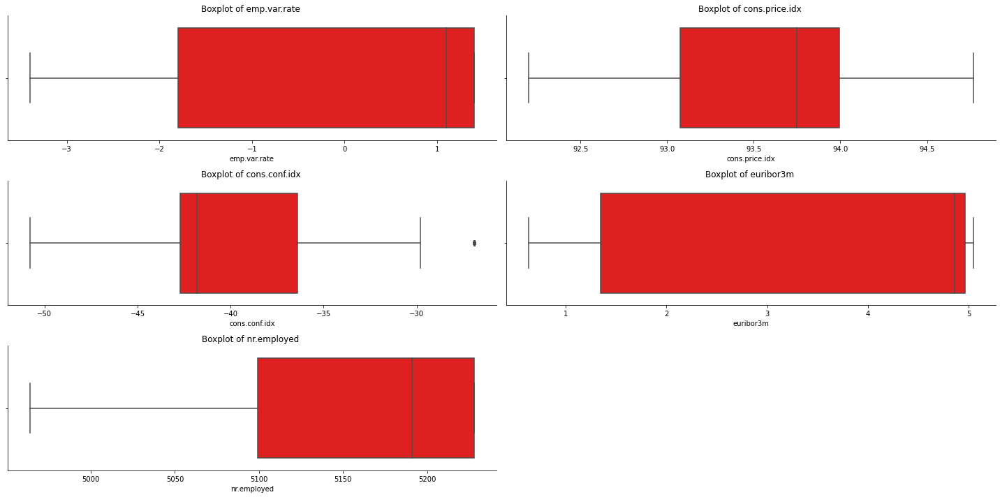

In [18]:
#Distribution of social and economic context attributes
plt.figure(figsize=[20,10])
socio_eco_variables=["emp.var.rate", "cons.price.idx", "cons.conf.idx", "euribor3m", "nr.employed"]
n=1
for i in socio_eco_variables:
    plt.subplot(3,2,n)
    sns.boxplot(x=i, data=df, palette = 'brg')
    sns.despine()
    plt.title("Boxplot of {} ".format(i))
    n=n+1
plt.tight_layout()
plt.show()

In [19]:
df['cons.conf.idx'].describe()

count    41188.000000
mean       -40.502600
std          4.628198
min        -50.800000
25%        -42.700000
50%        -41.800000
75%        -36.400000
max        -26.900000
Name: cons.conf.idx, dtype: float64

# Data Visualization

Visualizing each attribute with respect to the target column response to evaluate the performance of telemarketing campaign

**Age with respect to Response**

In [20]:
#Age
age_range = [df]
for i in age_range:
    i.loc[i['age']<28, 'age_group'] = 20
    i.loc[(i['age']>=29) & (i['age']<=39), 'age_group'] = 30
    i.loc[(i['age']>=40) & (i['age']<=49), 'age_group'] = 40
    i.loc[(i['age']>=50) & (i['age']<=59), 'age_group'] = 50
    i.loc[i['age']>=60, 'age_group'] = 60

In [21]:
cnt_age_resp = pd.crosstab(df['response'],df['age_group']).apply(lambda x: x/x.sum() * 100)
cnt_age_resp = cnt_age_resp.transpose() 

In [22]:
age_df = pd.DataFrame(df['age_group'].value_counts())
age_df['% Contacted'] = age_df['age_group']*100/age_df['age_group'].sum()
age_df['% Subscribed'] = cnt_age_resp['yes']
age_df.drop('age_group',axis = 1,inplace = True)

age_df['age'] = [30,40,50,20,60]
age_df = age_df.sort_values('age',ascending = True)

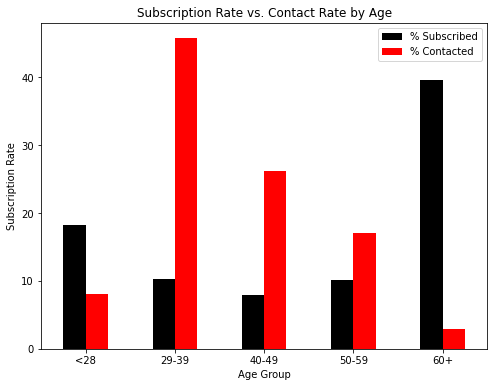

In [23]:
g_age = age_df[['% Subscribed','% Contacted']].plot(kind = 'bar',
                                              figsize=(8,6), color = ('black','red'))
plt.xlabel('Age Group')
plt.ylabel('Subscription Rate')
plt.xticks(np.arange(5), ('<28', '29-39', '40-49', '50-59', '60+'),rotation = 'horizontal')
plt.title('Subscription Rate vs. Contact Rate by Age')
plt.show()

**Insights:** Target the youngest and the oldest instead of the middle-aged

The graph indicates that clients with a age of 60+ have the highest subscription rate at 39%. About 18% of the subscriptions came from the clients aged between 18 to 29. More than 50% of the subscriptions are contributed by the youngest and the eldest clients.

It is not surprising to see such a pattern because the main investment objective of older people is saving for retirement while the middle-aged group tend to be more aggressive with a main objective of generating high investment income. Term deposits, as the least risky investment tool, are more preferable to the eldest. The youngest may not have enough money or professional knowledge to engage in sophisticated investments, such as stocks and mutual funds. Term deposits provide liquidity and generate interest incomes that are higher than the regular saving account, so term deposits are ideal investments for students. However, red vertical bars show that the bank focused its marketing efforts on the middle-aged group, which returned lower subscription rates than the younger and older groups. Thus, to make the marketing campaign more effective, the bank should target younger and older clients in the future.

In [24]:
# Job
cnt_job_resp = pd.crosstab(df['response'],df['job']).apply(lambda x: x/x.sum() * 100)
cnt_job_resp = cnt_job_resp.transpose()

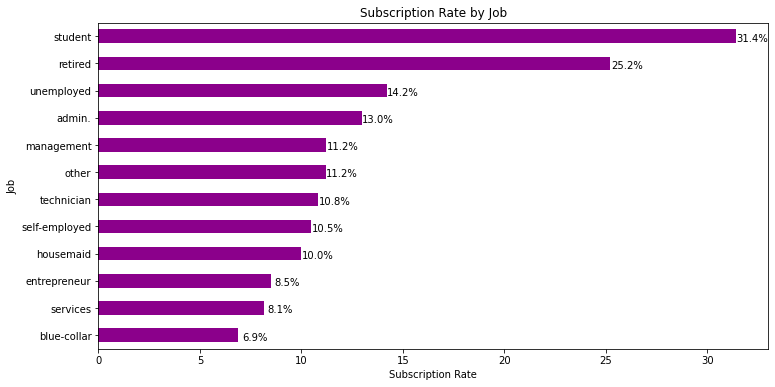

In [25]:
g_job = cnt_job_resp['yes'].sort_values(ascending = True).plot(kind = 'barh', figsize = (12,6), color = 'darkmagenta')

plt.title('Subscription Rate by Job')
plt.xlabel('Subscription Rate')
plt.ylabel('Job')

# Label each bar
for rec, label in zip(g_job.patches,
                      cnt_job_resp['yes'].sort_values(ascending = True).round(1).astype(str)):
    g_job.text(rec.get_width()+0.8, 
                  rec.get_y()+ rec.get_height()-0.5, 
                  label+'%', 
                  ha = 'center', 
                  va='bottom')

**Observation**

Job – Response graph agrees with the Age-Response graph showing Students and Retired clients response positive, followed by unemployed and white collar jobs

**Insights**

Target students, retired, unemployed clients more than clients who are admin or blue collared.


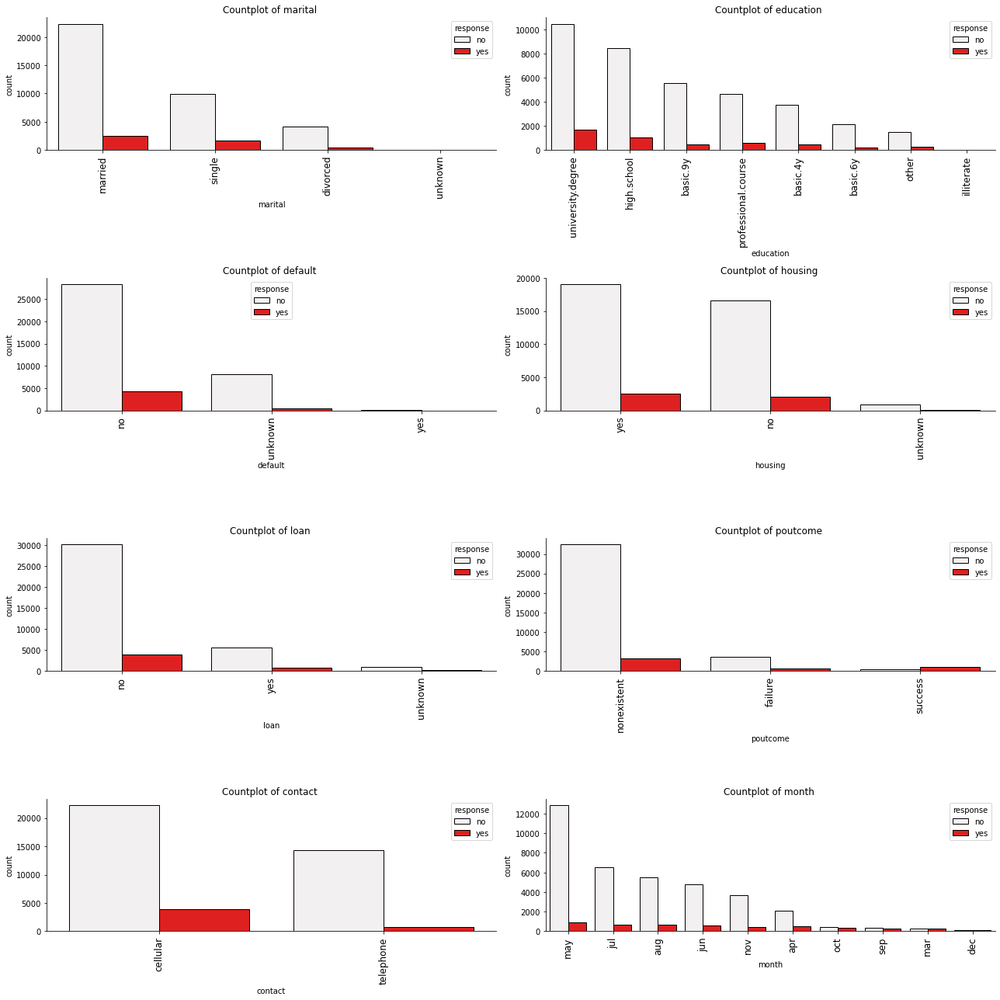

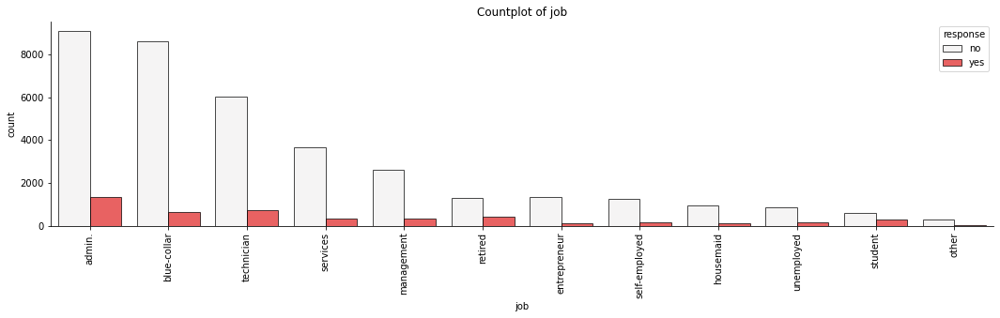

In [26]:
#Distribution of Categorical Variables
plt.figure(figsize=[18,18])
cat_variables=["marital", "education", "default", "housing", "loan", "poutcome","contact", "month"]
n=1
for i in cat_variables:
    order1 = df[i].value_counts(ascending=False).index
    plt.subplot(4,2,n)
    sns.countplot(x=i, edgecolor="black", alpha=1, data=df, order = order1, hue = 'response', color = 'red')
    plt.xticks(fontsize = 12 ,rotation=90)
    sns.despine()
    plt.title("Countplot of {} ".format(i))
    n=n+1
plt.tight_layout()
plt.show()

    
plt.figure(figsize=[18,4])
order1 = df['job'].value_counts(ascending=False).index
sns.countplot(x='job',edgecolor="black", alpha=0.7, data=df, hue = 'response', order = order1, color = 'red')
plt.xticks(fontsize=10,rotation=90)
sns.despine()
plt.title("Countplot of job")
plt.show()

**Observations:**

In the education-response graph, university degree, professional course and unknown have higher conversion.

In marital – response graph, single clients followed by married have high conversion rate. Divorced clients show lowest conversion.

The default and housing graph does not show a strong relationship with response.

The personal loan graph indicates that clients without existing personal loans were contacted more than the ones with. But the percentage of positive response is equal in both cases. 

Poutcome: Outcome of the previous marketing campaign shows clients who enrolled/interested in previous campaign had a positive response.
    
**Insights:**

Clients with personal loans must be contacted and equal number of clients with personal loans must be contacted to compare and support the observation that clients with PL have a higher chance of investing in FD.

Clients who have shown interest in previous products should be contacted more.

Response of clients contacted on cellphone is more positive than telephone. 

Target clients with higher level education, need to find what unknown indicate.

Target clients who are single, with second priority married client.

In [27]:
fig = px.box(df, y= 'duration', x="response", title = "Relationship between Duration and Resposne")
fig.show()

In [28]:
fig = px.box(df, y= 'campaign', x="response", title = "Campaign response")
fig.show()

In [29]:
#duration and response
fig = px.scatter(df, x="duration", y="campaign", color = 'response', 
                 title= 'Relationship between Number of Calls and their Duration with Response',
                labels= {'x':'Duration in seconds', 'y':'Number of Calls'})
fig.show()

**Observation**

As we can see from the plot, “yes” clients and “no” clients are forming two relatively separate clusters. Compared to “no” clients”, “yes” clients were contacted by fewer times and had longer call duration. More importantly, after five campaign calls, clients are more likely to reject the term deposit unless the duration is high. Most “yes” clients were approached by less than 10 times.


**Insights**

This suggests that the bank should resist calling a client for more than six times, which can be disturbing and increase dissatisfaction.

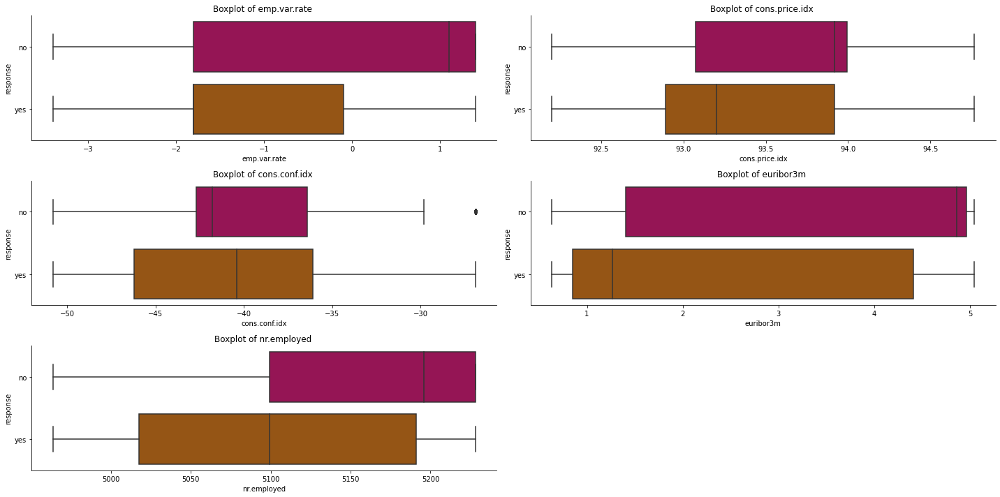

In [30]:
#Distribution of social and economic context attributes
plt.figure(figsize=[20,10])
socio_eco_variables=["emp.var.rate", "cons.price.idx", "cons.conf.idx", "euribor3m", "nr.employed"]
n=1
for i in socio_eco_variables:
    plt.subplot(3,2,n)
    sns.boxplot(x=i, data=df, y='response', palette = 'brg')
    sns.despine()
    plt.title("Boxplot of {} ".format(i))
    n=n+1
plt.tight_layout()
plt.show()

**Analysis**

*emp.var.rate: employment variation rate - quarterly indicator*

The variation of how many people are being hired or fired due to the shifts in the conditions of the economy.
Economists consider a natural unemployment rate of around 4%-6% to be an indicator of a healthy economy. Negative rate indicate inflation. employment variation rate shows clients were interested in term deposit when the rate was lower than when higher. When economy is in inflation, clients tend to invest in term deposit.


*cons.price.idx: consumer price index - monthly indicator*

Determines cost of living changes, inflation (high cpi), purchasing power, In consumer price index clients show more interest when CPI is between 92.8 – 93.8. When CPI is high, term deposit rate is low and clients tend to invest.


*cons.conf.idx: consumer confidence index - monthly indicator*

Consumer confidence, an economic indicator that measures the degree of optimism that consumers have regarding the overall state of a country's economy and their own financial situations.
If the most recent index is above 100, then consumers are more confident than they were in 1985. If it's below 100, they are less confident than during that time. Consumer confidence is negative. When CCI is negative clients tend to invest. When CPI is high, term deposit rate is low and clients tend to invest.


*euribor 3 month rate - daily indicator*

The 3 month Euribor interest rate is the interest rate at which a panel of banks lend money to one another with a maturity of 3 months. When euribor 3 month rate is over 4.9, client invests in term deposit.

In [31]:
cnt_marital_resp = pd.crosstab(df['response'],df['marital']).apply(lambda x: x/x.sum() * 100)
cnt_marital_resp = cnt_marital_resp.transpose()

In [32]:
g_marital = pd.DataFrame(df['marital'].value_counts())
g_marital['% Contacted'] = g_marital['marital']*100/g_marital['marital'].sum()
g_marital['% Subscription'] = cnt_marital_resp['yes']

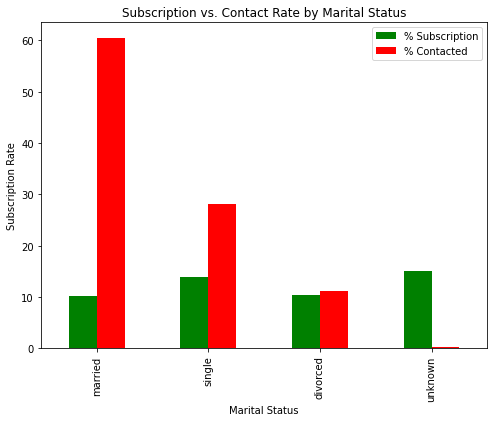

In [33]:
plot_marital = g_marital[['% Subscription','% Contacted']].plot(kind = 'bar',
                                              figsize=(8,6), color = ('green','red'))
plt.xlabel('Marital Status')
plt.ylabel('Subscription Rate')
plt.title('Subscription vs. Contact Rate by Marital Status')
plt.show()

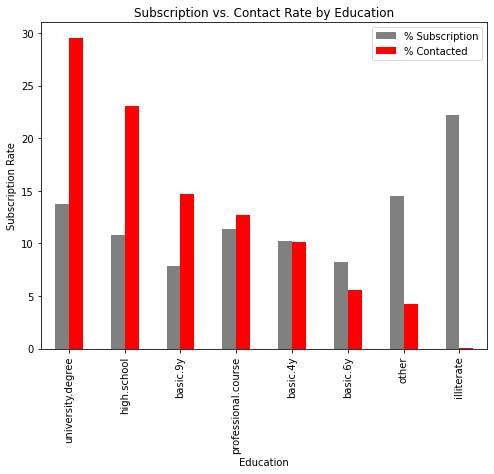

In [34]:
cnt_edu_resp = pd.crosstab(df['response'],df['education']).apply(lambda x: x/x.sum() * 100)
cnt_edu_resp = cnt_edu_resp.transpose()


g_edu = pd.DataFrame(df['education'].value_counts())
g_edu['% Contacted'] = g_edu['education']*100/g_edu['education'].sum()
g_edu['% Subscription'] = cnt_edu_resp['yes']


plot_edu = g_edu[['% Subscription','% Contacted']].plot(kind = 'bar',
                                              figsize=(8,6), color = ('grey','red'))
plt.xlabel('Education')
plt.ylabel('Subscription Rate')
plt.title('Subscription vs. Contact Rate by Education')
plt.show()

**Observations:** 
    
In the education-response graph, university degree, professional course and unknown have higher conversion.

In marital – response graph, single clients followed by married have high conversion rate. Divorced clients show lowest conversion.

**Insights:**
    
Target clients with higher level education, need to find what unknown indicate.

Target clients who are single, with second priority married client


In [35]:
cnt_month_resp = pd.crosstab(df['response'], df['month']).apply(lambda x: x/x.sum() * 100)
cnt_month_resp = cnt_month_resp.transpose()

In [36]:
month_df = pd.DataFrame(df['month'].value_counts())
month_df['% Contacted'] = month_df['month']*100/month_df['month'].sum()
month_df['% Subscription'] = cnt_month_resp['yes']

Text(0.5, 0, 'Month')

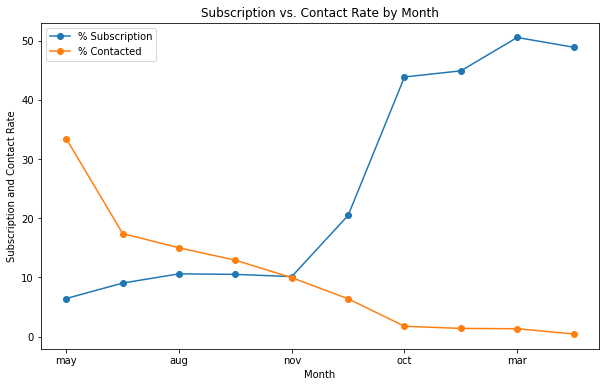

In [37]:
g_month = month_df[['% Subscription','% Contacted']].plot(kind ='line',figsize = (10,6), marker = 'o')

plt.title('Subscription vs. Contact Rate by Month')
plt.ylabel('Subscription and Contact Rate')
plt.xlabel('Month')

**Insights:**

Initiate the telemarketing campaign in fall or spring

Besides customer characteristics, external factors may also have an impact on the subscription rate, such as seasons and the time of calling. So the month of contact is also analyzed here.

This line chart displays the bank’s contact rate in each month as well as clients’ response rate in each month. One way to evaluate the effectiveness of the bank's marketing plan is to see whether these two lines have a similar trend over the same time horizon.

The bank contacted most clients between May and August. The highest contact rate is around 30%, which happened in May, while the contact rate is closer to 0 in March, September, October, and December. However, the subscription rate showed a different trend. The highest subscription rate occurred in March, which is over 50%, and all subscription rates in September, October, and December are over 40%. Clearly, these two lines move in different directions which strongly indicates the inappropriate timing of the bank’s marketing campaign. To improve the marketing campaign, the bank should consider initiating the telemarketing campaign in fall and spring when the subscription rate tends to be higher.

Nevertheless, the bank should be cautious when analyzing external factors. More data from previous marketing campaign should be collected and analyzed to make sure that this seasonal effect is constant over time and applicable to the future.

Text(0.5, 0, 'Weekday')

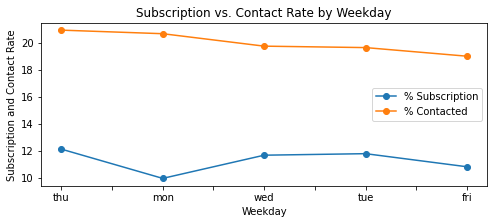

In [38]:
cnt_week_resp = pd.crosstab(df['response'], df['day_of_week']).apply(lambda x: x/x.sum() * 100)
cnt_week_resp = cnt_week_resp.transpose()

week_df = pd.DataFrame(df['day_of_week'].value_counts())
week_df['% Contacted'] = week_df['day_of_week']*100/week_df['day_of_week'].sum()
week_df['% Subscription'] = cnt_week_resp['yes']


g_week = week_df[['% Subscription','% Contacted']].plot(kind ='line',figsize = (8,3), marker = 'o')

plt.title('Subscription vs. Contact Rate by Weekday')
plt.ylabel('Subscription and Contact Rate')
plt.xlabel('Weekday')

**Observation**

Contacts per day chart displays response on Tuesday and Wednesday is more as compared to Monday where its low even when contact made are max of week. 


**Insights:**

Contacts should be made preferably on Tuesday, Wednesday and Thursday. 
Productivity of marketing team is maximum on Monday and least on Friday.

In [39]:
fig = px.box(df, y= 'ModelPrediction', x="response", title = "Previous Model Accuracy", color = 'response')
fig.show()

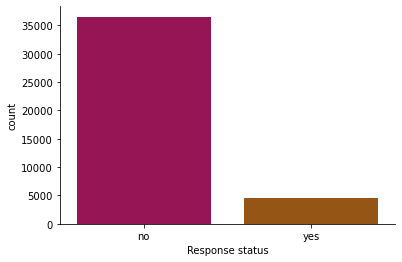

In [40]:
g = sns.countplot(data = df, x = 'response', palette = 'brg')
g.set_xlabel('Response status')
sns.despine()

On the diagram we see that counts for 'yes' and 'no' values for 'response' are close, so we can use accuracy as a metric for a model, which predicts the campaign outcome. But in our case they are not close

For Response: No The interquartile range here is 88% to 96% For Response: Yes The interquartile range here is 94% to 57%

Majority of the responses received were negative and the response column shows a higher possibility of positive response for FD when the real life its negative. The model needs to be changed.

# CONCLUSION

**Target Customer Profile**

Feature 1: age < 30 or age > 60

Feature 2: students or retired people

Feature 3: marital status is Single

Feature 4: Higher education level

**Recommendations**

Timing: March and September have highest positive response, marketing should be started in fall and spring.

Mid week days have a higher positive response.

Response is more positive when contacted over a cell phone

Calls made to the client should be limited to a total of 6

Clients who have subcribed for previous product have higher chances of subscribing to this product

Prediction model is not accurate and must be replaced.

# Machine Learning Models

The main objective of this project is to identify the most responsive customers before the marketing campaign so that the bank will be able to efficiently reach out to them, saving time and marketing resources. To achieve this objective, classification algorithms will be employed. By analyzing customer statistics, a classification model will be built to classify all clients into two groups: "yes" to term deposits and "no" to term deposits

**Preparing data for Classification Models**

Only the most relevant customer information is considered, which includes job title, education, age, balance, default record, housing record and loan record. 

In [41]:
df1 = pd.read_csv('DSA Data Set.csv')
df1.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,ModelPrediction,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0.932750,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0.953579,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0.945724,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0.933875,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0.940996,no


**Coverting Categorical variables into Dummy Variables**

Since machine learning algorithms only take numerical values, all five categorical variables (job, education, default, housing and loan) are transformed into dummy variables.

In [42]:
df1.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,ModelPrediction,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0.932750,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0.953579,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0.945724,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0.933875,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0.940996,no


In [66]:
df2 = pd.DataFrame()

In [67]:
from sklearn.preprocessing import LabelEncoder
labelencoder_X = LabelEncoder()
df2['job']      = labelencoder_X.fit_transform(df1['job']) 
df2['education']= labelencoder_X.fit_transform(df1['education']) 
df2['default']  = labelencoder_X.fit_transform(df1['default']) 
df2['housing']  = labelencoder_X.fit_transform(df1['housing']) 
df2['contact']     = labelencoder_X.fit_transform(df1['contact'])
df2['month']     = labelencoder_X.fit_transform(df1['month'])
df2['day_of_week']     = labelencoder_X.fit_transform(df1['day_of_week'])
df2['poutcome']     = labelencoder_X.fit_transform(df1['poutcome'])
df2['loan']     = labelencoder_X.fit_transform(df1['loan'])
df2['marital']     = labelencoder_X.fit_transform(df1['marital'])
df2['y']     = labelencoder_X.fit_transform(df1['y'])

In [68]:
df2.head()

,job,education,default,housing,contact,month,day_of_week,poutcome,loan,marital,y
0,3,0,0,0,1,6,1,1,0,1,0
1,7,3,1,0,1,6,1,1,0,1,0
2,7,3,0,2,1,6,1,1,0,1,0
3,0,1,0,0,1,6,1,1,0,1,0
4,7,3,0,0,1,6,1,1,2,1,0


In [101]:
from sklearn.preprocessing import LabelEncoder
labelencoder_X = LabelEncoder()
df1['job']      = labelencoder_X.fit_transform(df1['job']) 
df1['education']= labelencoder_X.fit_transform(df1['education']) 
df1['default']  = labelencoder_X.fit_transform(df1['default']) 
df1['housing']  = labelencoder_X.fit_transform(df1['housing']) 
df1['contact']     = labelencoder_X.fit_transform(df1['contact'])
df1['month']     = labelencoder_X.fit_transform(df1['month'])
df1['day_of_week']     = labelencoder_X.fit_transform(df1['day_of_week'])
df1['poutcome']     = labelencoder_X.fit_transform(df1['poutcome'])
df1['loan']     = labelencoder_X.fit_transform(df1['loan'])
df1['marital']     = labelencoder_X.fit_transform(df1['marital'])
df1['y']     = labelencoder_X.fit_transform(df1['y'])

**Feature Selection**

The last column, 'campaign outcome', is set as target whereas rest of the columns are selected as features

In [69]:
array = df2.values

# Features: first 20 columns
X = array[:,0:-1]

# Target variable: 'response_binary'
Y = array[:,-1]

**Train-Test Split**

In [70]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score

In [71]:
# 20% of the data will be used for testing
test_size= 0.20
seed = 7
X_train, X_test, Y_train, Y_test= train_test_split(X, Y, test_size=test_size, random_state=seed)

**Compare classification algorithms**


Four different classification algorithms (Logistic Regression, K-Neighbors Classifier, Decision Tree Classifier, and Gaussian NB) are run on the dataset and the best-performing one will be used to build the classification model.

In [72]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB

In [73]:
models = []
models.append(('LR', LogisticRegression()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))

In [74]:
results_c = []
names_c = []

for name, model in models:
    # define how to split off validation data ('kfold' how many folds)
    kfold = KFold(n_splits=10, random_state=seed)    
    # train the model
    cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring='accuracy')    
    results_c.append(cv_results)
    names_c.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: 0.887132 (0.005861)
KNN: 0.884704 (0.006226)
CART: 0.863612 (0.003992)
NB: 0.844401 (0.005191)


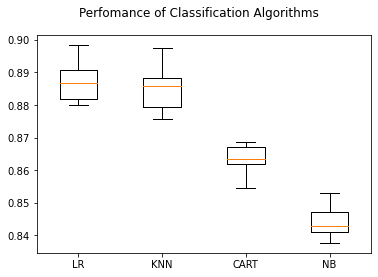

In [75]:
fig = plt.figure()
fig.suptitle('Perfomance of Classification Algorithms')
ax = fig.add_subplot(111)
plt.boxplot(results_c)
ax.set_xticklabels(names_c)
plt.show()

Logistic Regression is the best performing model at 88% accuracy

In [83]:
LR = LogisticRegression()
LR.fit(X_train, Y_train)

LogisticRegression()

In [84]:
predictions = LR.predict(X_test)

In [85]:
# Accuracy Score 
print(accuracy_score(Y_test, predictions))

0.8901432386501578


Accuracy score is the percentage of correct predictions out of all predictions made. The Logistic regression algorithm achieves an accuracy of 90%, suggesting high level of strength of this model to classify the customer response given all the defined customer features.

[[7331    2]
 [ 903    2]]


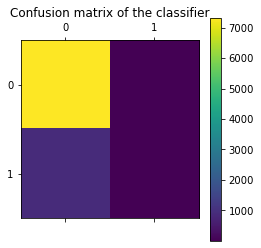

In [86]:
# Confusion Matrix 
from sklearn.metrics import confusion_matrix
import pylab as pl

print(confusion_matrix(Y_test, predictions))

cm = confusion_matrix(Y_test, predictions)
pl.matshow(cm)
pl.title('Confusion matrix of the classifier')
pl.colorbar()
pl.show()

A problem revealed by this confusion matrix is that the dataset is highly unbalanced, with nearly all client actually decline to subscribe. This infers that the accuracy score is biased, and further evaluation should be carried out to determine the accuracy of logistic regression model.

In [87]:
# Classification Report
from sklearn.metrics import classification_report
print(classification_report(Y_test, predictions))

              precision    recall  f1-score   support

           0       0.89      1.00      0.94      7333
           1       0.50      0.00      0.00       905

    accuracy                           0.89      8238
   macro avg       0.70      0.50      0.47      8238
weighted avg       0.85      0.89      0.84      8238



Precision of 0 (the client said no) represents that for all instances predicted as no subscription, the percentage of clients that actually said no is 89%.

Recall is the ability of a classifier to find all positive instances. Recall of 0 indicates that for all clients that actually said no, the model predicts 100% correctly that they would decline the offer.

**Machine Learning: Regression**

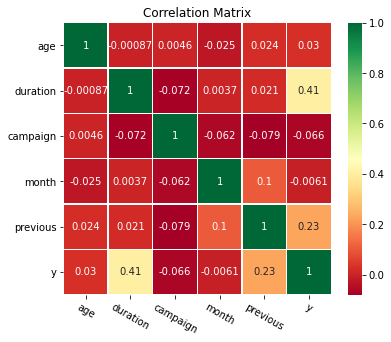

In [88]:
corr_data = df1[['age','duration','campaign','month','previous','y']]
corr = corr_data.corr()

cor_plot = sns.heatmap(corr,annot=True,cmap='RdYlGn',linewidths=0.2,annot_kws={'size':10})
fig=plt.gcf()
fig.set_size_inches(6,5)
plt.xticks(fontsize=10,rotation=-30)
plt.yticks(fontsize=10)
plt.title('Correlation Matrix')
plt.show()

Feature selection

In [116]:
array = df1.values

# Features: first 20 columns
X = array[:,0:-2]

# Target variable: 'response_binary'
Y = array[:,-1]


In [117]:
#train test split
test_size= 0.20
seed = 10
X_train, X_test, Y_train, Y_test= train_test_split(X, Y, test_size=test_size, random_state=seed)

In [118]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor

In [119]:
models = []
models.append(('LR', LinearRegression()))
models.append(('LASSO', Lasso()))
models.append(('RIDGE', Ridge()))
models.append(('EN', ElasticNet()))
models.append(('KNN', KNeighborsRegressor()))
models.append(('CART', DecisionTreeRegressor()))

In [120]:
results_e2 = []
names_e2 = []

for name, model in models:
    # define how to split off validation data
    kfold = KFold(n_splits=10, random_state=seed)
    
    # train the model
    cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring='neg_mean_squared_error')
    results_e2.append(cv_results)
    names_e2.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: -0.065068 (0.002311)
LASSO: -0.067858 (0.002499)
RIDGE: -0.065068 (0.002311)
EN: -0.067707 (0.002460)
KNN: -0.068751 (0.002612)
CART: -0.109044 (0.004360)


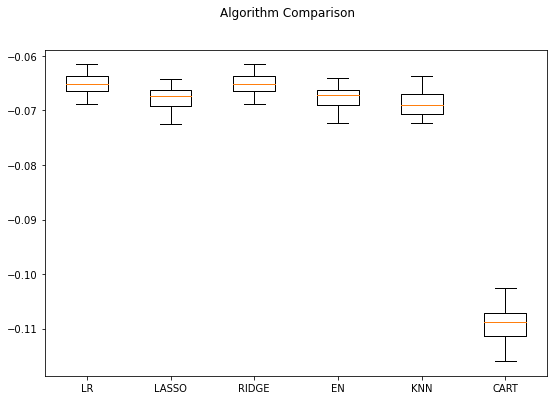

In [121]:
# Plot results
fig = plt.figure(figsize=(9,6))
ax = fig.add_subplot(111)
plt.boxplot(results_e2)

fig.suptitle('Algorithm Comparison')
ax.set_xticklabels(names_e2)
plt.show()

In [122]:
#Standardise data
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

pipelines = []
pipelines.append(('ScaledLR', Pipeline([('Scaler', StandardScaler()),('LR', LinearRegression())])))
pipelines.append(('ScaledLASSO', Pipeline([('Scaler', StandardScaler()),('LASSO', Lasso())])))
pipelines.append(('ScaledRIDGE', Pipeline([('Scaler', StandardScaler()),('RIDGE', Ridge())])))
pipelines.append(('ScaledEN', Pipeline([('Scaler', StandardScaler()),('EN', ElasticNet())])))
pipelines.append(('ScaledKNN', Pipeline([('Scaler', StandardScaler()),('KNN', KNeighborsRegressor())])))
pipelines.append(('ScaledCART', Pipeline([('Scaler', StandardScaler()),('CART', DecisionTreeRegressor())])))

In [123]:
results_e2_normalized = []
names_e2_normalized = []

for name, model in pipelines:
    # define how to split off validation data
    kfold = KFold(n_splits=10, random_state=seed)
    
    # train the model
    cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring='neg_mean_squared_error')
    results_e2_normalized.append(cv_results)
    names_e2_normalized.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

ScaledLR: -0.065068 (0.002311)
ScaledLASSO: -0.099976 (0.005420)
ScaledRIDGE: -0.065068 (0.002311)
ScaledEN: -0.099976 (0.005420)
ScaledKNN: -0.071578 (0.003098)
ScaledCART: -0.109256 (0.005793)


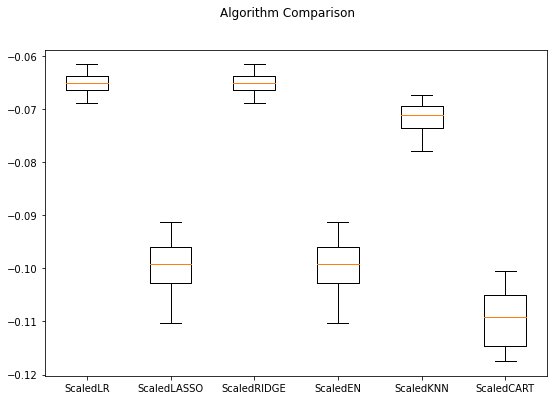

In [124]:
# Plot results
fig = plt.figure(figsize=(9,6))
ax = fig.add_subplot(111)
plt.boxplot(results_e2_normalized)

fig.suptitle('Algorithm Comparison')
ax.set_xticklabels(names_e2_normalized)
plt.show()

In [125]:
ridge = Ridge()
ridge.fit(X_train, Y_train)
predicted_y = ridge.predict(X_test)

In [126]:
from sklearn.metrics import mean_squared_error
print('The MSE is', mean_squared_error(Y_test, predicted_y))

The MSE is 0.06872758833475229
